In [7]:
#imports
import os
import math
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from model import *
from tensorflow import keras
from IPython.display import display
from tensorflow.keras import Input, Model
from tensorflow.keras.preprocessing import image_dataset_from_directory

from utils import *

In [8]:
root_dir= "DIV2K/DIV2K_train_HR" #path of training dataset
resize = 400
upscale_factor = 4 #change to desired scale (3,4,8)
input_size = resize // upscale_factor
batchsize = 15

In [10]:
train_ds = image_dataset_from_directory(
        root_dir,
        batch_size=batchsize,
        image_size=(resize, resize),
        validation_split=0.2,
        subset="training",
        seed=1337,
        label_mode=None,
        interpolation='bicubic'
)

valid_ds = image_dataset_from_directory(
        root_dir,
        batch_size=batchsize,
        image_size=(resize, resize),
        validation_split=0.2,
        subset="validation",
        seed=1337,
        label_mode=None,
        interpolation='bicubic'
)


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)


Found 900 files belonging to 1 classes.
Using 720 files for training.
Found 900 files belonging to 1 classes.
Using 180 files for validation.


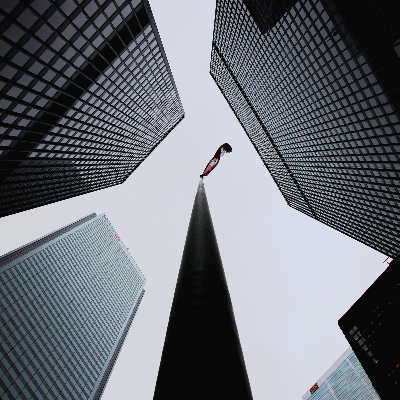

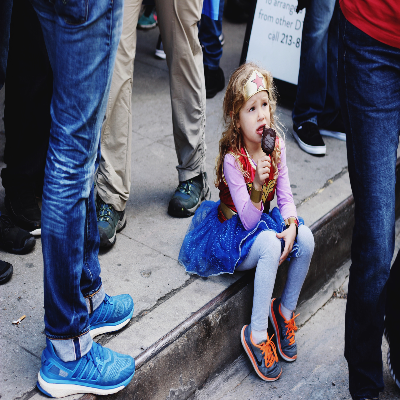

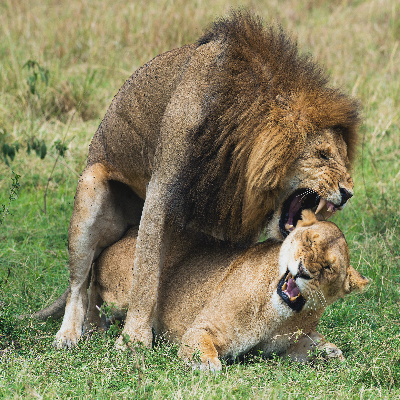

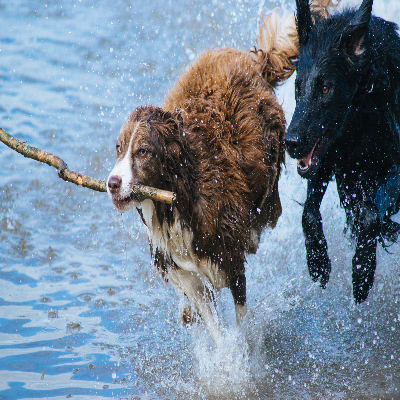

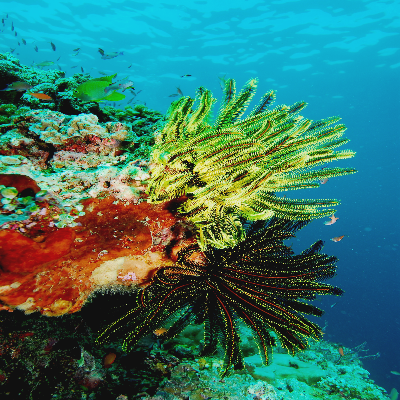

...

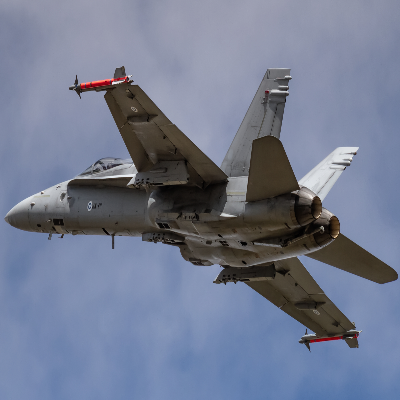

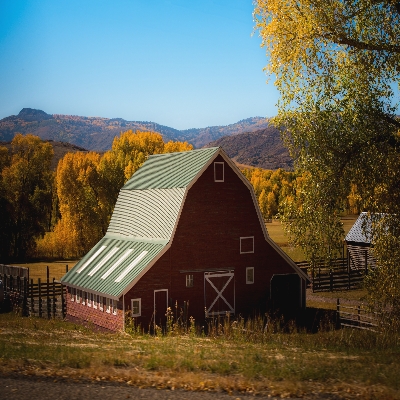

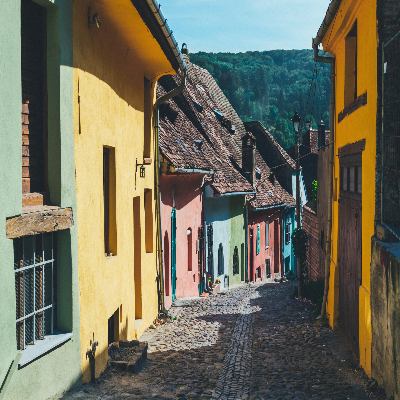

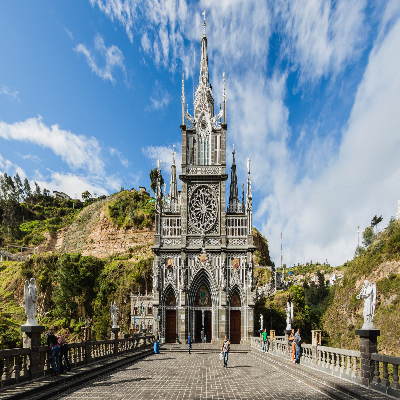

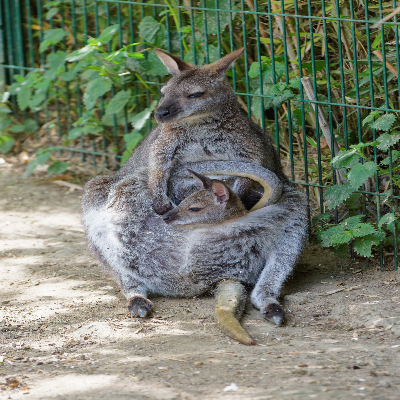

In [11]:
#to view batch from dataset
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

In [12]:
train_ds = train_ds.map(
           lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)

train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
          lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)

valid_ds = valid_ds.prefetch(buffer_size=32)
print(train_ds)

<PrefetchDataset shapes: ((None, 200, 200, 3), (None, 400, 400, 3)), types: (tf.float32, tf.float32)>


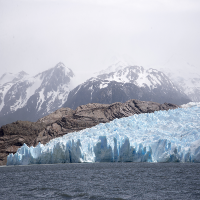

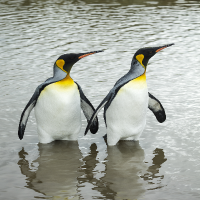

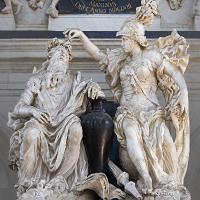

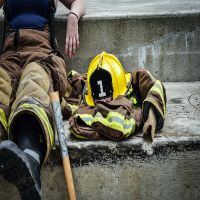

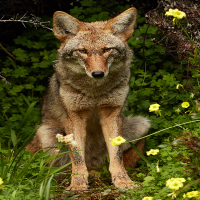

...

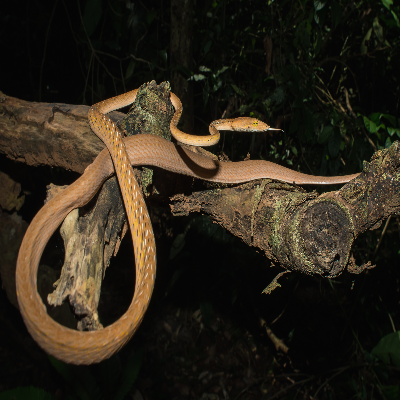

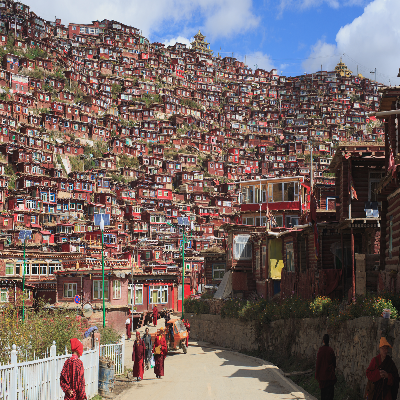

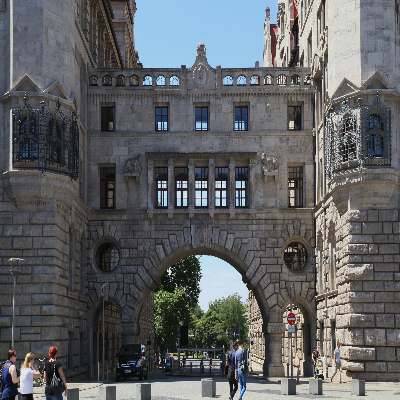

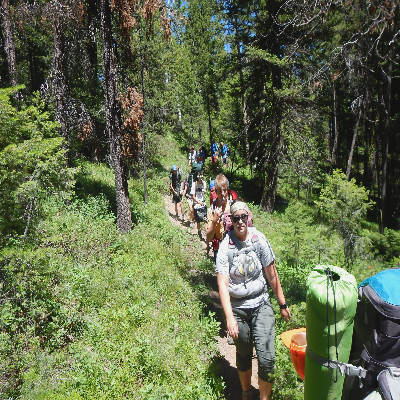

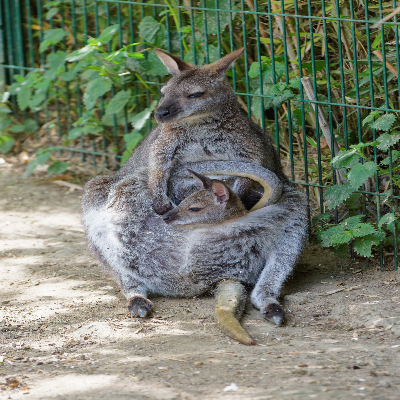

In [13]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

In [14]:
rfanet_x = RFDNNet()
#build keras model
x = Input(shape=(None, None, 3))
out = rfanet_x.main_model(x, upscale_factor)
model = Model(inputs=x, outputs=out)
model.summary()

early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "weights"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    checkpoint_filepath + '/x2.h5',
    monitor="loss",
    mode="min",
    save_best_only=True,
    period=1
)
#ESPCNCallback(),
MyCallbacks = [ early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

ep = 100

model.compile(
    optimizer=optimizer, loss=loss_fn, metrics = ['accuracy']
)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   1792        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 conv2d_2 (Conv2D)              (None, None, None,   36928       ['conv2d[0][0]']                 
                                64)                                                           

In [15]:
history = model.fit(
    train_ds, epochs=ep, callbacks=MyCallbacks, validation_data=valid_ds, verbose=1
)

Epoch 1/100
48/48 [==============================] - 810s 17s/step - loss: 0.5336 - accuracy: 0.3634 - val_loss: 0.0216 - val_accuracy: 0.3630
Epoch 2/100
48/48 [==============================] - 805s 17s/step - loss: 0.0191 - accuracy: 0.4837 - val_loss: 0.0127 - val_accuracy: 0.6052
Epoch 3/100
48/48 [==============================] - 812s 17s/step - loss: 0.0123 - accuracy: 0.6685 - val_loss: 0.0095 - val_accuracy: 0.7028
Epoch 4/100
48/48 [==============================] - 805s 17s/step - loss: 0.0100 - accuracy: 0.7126 - val_loss: 0.0082 - val_accuracy: 0.7356
Epoch 5/100
48/48 [==============================] - 805s 17s/step - loss: 0.0088 - accuracy: 0.7346 - val_loss: 0.0073 - val_accuracy: 0.7440
Epoch 6/100
48/48 [==============================] - 809s 17s/step - loss: 0.0080 - accuracy: 0.7465 - val_loss: 0.0067 - val_accuracy: 0.7631
Epoch 7/100
48/48 [==============================] - 807s 17s/step - loss: 0.0075 - accuracy: 0.7586 - val_loss: 0.0067 - val_accuracy: 0.7412

In [16]:
 history.history

{'loss': [0.533643901348114,
  0.019137118011713028,
  0.012295560911297798,
  0.01001561526209116,
  0.008795954287052155,
  0.008012589067220688,
  0.0074968887493014336,
  0.007095314562320709,
  0.006913467776030302,
  0.006521119736135006,
  0.006331827025860548,
  0.006274920888245106,
  0.006051477510482073,
  0.005832195281982422,
  0.005813135765492916,
  0.005685881245881319,
  0.005750942975282669,
  0.005604999605566263,
  0.005557740572839975,
  0.005467469338327646,
  0.0054448265582323074,
  0.005574365612119436,
  0.005349557381123304,
  0.005321283359080553,
  0.005564920604228973,
  0.0052595543675124645,
  0.005395090207457542,
  0.005248432978987694,
  0.005222043953835964,
  0.005306399427354336,
  0.005193673074245453,
  0.005193133372813463,
  0.005204175598919392,
  0.005167252384126186,
  0.005126860458403826,
  0.005213327705860138,
  0.005128405522555113,
  0.005136418156325817,
  0.005163250491023064,
  0.005176078993827105,
  0.005072648171335459,
  0.00505

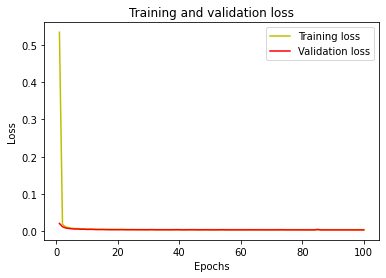

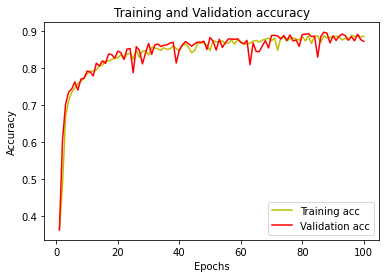

In [18]:
#plotting learning curve
#training and validation loss
loss = history.history['loss'] 
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
#trainig and validation accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [20]:
#save model
rfanet = tf.keras.models.load_model('weights/x2.h5')